# 07 PyTorch Experiment Tracking

Machine learning is very experimental.

In order to figure out which experiments are worth pursuing, that's where **experiment tracking** comes in, it helps you figure what doesn't work so you can figure out what **does** work.

In this notebook, we're going to see an example of programmatically tracking experiments.

Resources:
* Book version of the notebook: https://www.learnpytorch.io/07_pytorch_experiment_tracking/
* Extra curriculum : https://madewithml.com/courses/mlops/experiment-tracking/

In [1]:
import torch
import torchvision

print(torch.__version__)
print(torchvision.__version__)

2.2.1+cu121
0.17.1+cu121


In [2]:
# Continue with regular imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/mrdbourke/pytorch-deep-learning
    !mv pytorch-deep-learning/going_modular .
    !rm -rf pytorch-deep-learning
    from going_modular.going_modular import data_setup, engine

[INFO] Couldn't find torchinfo... installing it.
[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 4056, done.
remote: Total 4056 (delta 0), reused 0 (delta 0), pack-reused 4056
Receiving objects: 100% (4056/4056), 646.90 MiB | 40.26 MiB/s, done.
Resolving deltas: 100% (2371/2371), done.
Updating files: 100% (248/248), done.


In [3]:
# Setup device agnostic code
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [4]:
# Set seeds
def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)

## 1. Get Data

Want to get pizza, steak, sushi images.

So we can run experiments building FoodVision Mini and see which model performs best.

In [5]:
import os
import zipfile
import requests

from pathlib import Path

def download_data(source: str,
                  destination: str,
                  remove_source: bool = True) -> Path:

  """Downloads a zipped dataset and unzips to destination"""
  # Setup a path to data folder
  data_path = Path('data/')
  image_path = data_path / destination

  # If the image folder doesn't, create it
  if image_path.is_dir():
    print(f'[INFO] {image_path} directory already exists, skipping download.')
  else:
    print(f'[INFO] Did not find {image_path} directory, creating one...')
    image_path.mkdir(parents = True,
                     exist_ok = True)

    # Download the target data
    target_file = Path(source).name
    with open(data_path / target_file, 'wb') as f:
      request = requests.get('https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip')
      print(f'[INFO] Downloading {target_file} from {source}...')
      f.write(request.content)

    # Unzip target file
    with zipfile.ZipFile(data_path / target_file, 'r') as zipref:
      print(f'[INFO] Unzipping {target_file} data ...')
      zipref.extractall(image_path)

    # Remove .zip file if needed
    if remove_source:
      os.remove(data_path/target_file)
  return image_path

In [6]:
image_path = download_data(source = 'https://github.com/mrdbourke/pytorch-deep-learning/blob/main/data/pizza_steak_sushi.zip',
                           destination = 'pizza_steak_sushi')
image_path

[INFO] Did not find data/pizza_steak_sushi directory, creating one...
[INFO] Downloading pizza_steak_sushi.zip from https://github.com/mrdbourke/pytorch-deep-learning/blob/main/data/pizza_steak_sushi.zip...
[INFO] Unzipping pizza_steak_sushi.zip data ...


PosixPath('data/pizza_steak_sushi')

## 2. Creating datasets and DataLoaders


### 2.1 Creating DataLoaders with manual transforms

The goal with tansforms is to ensure your custom data is formatted in a wreproducible way as well as in the way that will suit pretrained models.

In [7]:
# Setup train and test dir
train_dir = image_path / 'train'
test_dir = image_path / 'test'

train_dir, test_dir

(PosixPath('data/pizza_steak_sushi/train'),
 PosixPath('data/pizza_steak_sushi/test'))

In [8]:
image_path

PosixPath('data/pizza_steak_sushi')

In [9]:
# Setup imagenet normalization levels
from torchvision import transforms
normalize = transforms.Normalize(mean = [0.485, 0.456, 0.406],
                                 std = [0.229, 0.224, 0.225])

# Create transform pipeline manually
manual_transforms = transforms.Compose([
    transforms.Resize(size = (224, 224)),
    transforms.ToTensor(),
    normalize
])
print(f"Manually created transforms: {manual_transforms}")

# Create DataLoaders
from going_modular.going_modular import data_setup
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir = train_dir,
                                                                               test_dir = test_dir,
                                                                               transform = manual_transforms,
                                                                               batch_size = 32)

train_dataloader, test_dataloader, class_names

Manually created transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


(<torch.utils.data.dataloader.DataLoader at 0x7f9e761e2830>,
 ['pizza', 'steak', 'sushi'])

### 2.2 Creating a transform for `torchvision.models` (auto creation)

The same principle applies for automatic transforms: we want our cutom data in the same format as the pretrained model was trained on.

In [10]:
# Setup pretrained weights for EffnetB0
from torchvision.models import EfficientNet_B0_Weights
weights = EfficientNet_B0_Weights.DEFAULT # best weights available

# Get transforms from weights (these are the transforms that were used to obtain the weights)
automatic_transforms = weights.transforms()
print(f"Automatically created transforms: {automatic_transforms}")

# Create data loaders
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir=train_dir,
    test_dir=test_dir,
    transform=automatic_transforms, # use automatic created transforms
    batch_size=32
)

train_dataloader, test_dataloader, class_names

Automatically created transforms: ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)


(<torch.utils.data.dataloader.DataLoader at 0x7f9e761e1330>,
 ['pizza', 'steak', 'sushi'])

## 3. Getting a pretrained model, freezing the base layers and changing the classifier head

In [11]:
# NOTE: This is how a pretrained model wouldbe created prior to torchvision v0.13
# OLD
# model = torchvision.models.efficientnet_b0(pretrained = True).to(device)

# Download the pretrained weights for the EffNetB0
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
model = torchvision.models.efficientnet_b0(weights = weights).to(device)
model

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 92.1MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [12]:
# Freeze all the layers by setting their requires_grad attribute to False
for param in model.features.parameters():
  param.requires_grad = False

In [13]:
# Summary
from torchinfo import summary
summary(model = model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [14]:
model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

In [15]:
# Adjust the classifier head
model.classifier = nn.Sequential(
    nn.Dropout(p = 0.2, inplace = True),
    nn.Linear(in_features = 1280,
              out_features = len(class_names))
)
model.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=3, bias=True)
)

In [16]:
# Summary
summary(model = model,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

## 4. Train a single model and track results

In [17]:
# Define a loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params = model.parameters(), lr = 0.001)


To track experiments, we're going to use TensorBoard : https://pytorch.org/docs/stable/tensorboard.html

And to interact with tensorboard we can use SummaryWriter.

In [18]:
# Setup a SummaryWriter
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()
writer

In [19]:
from going_modular.going_modular.engine import train_step, test_step
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

        ### NEW: Experiment Tracking ###
        writer.add_scalars(main_tag = 'Loss',
                           tag_scalar_dict = {'train_loss': train_loss,
                                              'test_loss': test_loss},
                           global_step = epoch)

        writer.add_scalars(main_tag = 'Accuracy',
                           tag_scalar_dict = {'train_acc':train_acc,
                                              'test_acc':test_acc},
                           global_step = epoch)

        writer.add_graph(model = model,
                         input_to_model = torch.randn(32, 3, 224, 224).to(device))

    # Close the writer
    writer.close()
    ### End New ###

    # Return the filled results at the end of the epochs
    return results

In [20]:
# Train model
# Note: Not using engine.train(), since we updated the train() function above
set_seeds()
results = train(model = model,
                train_dataloader = train_dataloader,
                test_dataloader = test_dataloader,
                optimizer =  optimizer,
                loss_fn = loss_fn,
                epochs = 5,
                device = device)

  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.0783 | train_acc: 0.3984 | test_loss: 0.9060 | test_acc: 0.6108
Epoch: 2 | train_loss: 0.9069 | train_acc: 0.6055 | test_loss: 0.7971 | test_acc: 0.7642
Epoch: 3 | train_loss: 0.7692 | train_acc: 0.7773 | test_loss: 0.6798 | test_acc: 0.8447
Epoch: 4 | train_loss: 0.6796 | train_acc: 0.7617 | test_loss: 0.6696 | test_acc: 0.8153
Epoch: 5 | train_loss: 0.7047 | train_acc: 0.7383 | test_loss: 0.6965 | test_acc: 0.7434


## 5. View our model's results with TensorBoard

Other ways to view metrics:
https://www.learnpytorch.io/07_pytorch_experiment_tracking/#5-view-our-models-results-in-tensorboard

In [21]:
# Let's view our experiments from within the notebook
%load_ext tensorboard
%tensorboard --logdir '/content/runs'

<IPython.core.display.Javascript object>

## 6. Create a function to prepare a `SummaryWriter()` Instance

By default our `SummaryWriter()`` class saves to `log_dir`.

How about if we wanted to save different experiments to different folders?

In essence one experiment = one folder.

For example, we'd like to track:
* Experiment date/ timestamp
* Experiment name
* Model name
* Extra - is there anything else that should be tracked?

Let's create a function to create a `SummaryWriter()` instance to take all of these things into account.

So ideally we end up tracking experiments to a directory:

`runs/YYYY-MM-DD/experiment_name/model_name/extra`


In [22]:
from torch.utils.tensorboard import SummaryWriter
def create_writer(experiment_name: str,
                  model_name:str,
                  extra: str=None):

  """Creates a torch.utils.tensorboard.writer.SummaryWriter() instance tracking to a specific directory."""
  from datetime import datetime
  import os

  # Get timestep of current date in reverse order
  timestamp = datetime.now().strftime('%Y-%m-%d')

  if extra:
    # Create log directory path
    log_dir = os.path.join('runs', timestamp, experiment_name, model_name, extra)
  else:
    log_dir = os.path.join('runs', timestamp, experiment_name, model_name)

  print(f"[INFO] Created SummaryWriter saving to {log_dir}")
  return SummaryWriter(log_dir = log_dir)

In [23]:
example_writer = create_writer(experiment_name = 'data_10_percent',
                               model_name = 'effnetb0',
                               extra = '5_epochs')
example_writer

[INFO] Created SummaryWriter saving to runs/2024-05-02/data_10_percent/effnetb0/5_epochs


### 6.1 Update the `train()` function to include a writer parameter

In [24]:
from going_modular.going_modular.engine import train_step, test_step
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.SummaryWriter) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

        ### NEW: Experiment Tracking ###
        if writer:

          writer.add_scalars(main_tag = 'Loss',
                            tag_scalar_dict = {'train_loss': train_loss,
                                                'test_loss': test_loss},
                            global_step = epoch)

          writer.add_scalars(main_tag = 'Accuracy',
                            tag_scalar_dict = {'train_acc':train_acc,
                                                'test_acc':test_acc},
                            global_step = epoch)

          writer.add_graph(model = model,
                          input_to_model = torch.randn(32, 3, 224, 224).to(device))

          # Close the writer
          writer.close()

        else:
          pass
    ### End New ###

    # Return the filled results at the end of the epochs
    return results

## 7. Setting up a series of Modelling Experiments

* Setup 2x modelling experiments with effnetb0, pizza, steak, sushi data and train one model for 5 epochs and another model for 10 epochs.

### 7.1 What kind of experiments should you run?

The number of Machine learning experiments you can run, is like the number of different models you can build.. almost limitless.

However, you can't test everything..

So what should you test?
* Change the number of epochs
* Change the number of hidden layers/units
* Change the amount of data (right now we're using 10% of the food101 dataset for pizza, steak, sushi)
* Change the learning rate
* Try different kinds of data augmentations
* Choose a different model architecture

This is why transfoer learning is so powerful, because its a working model that you can apply to your own problem.

### 7.2 What experiments are we going to run?

We're going to turn three dials:
1. Model size - EffnetB0 vs. EffnetB2 (in terms of number of parameters)
2. Dataset size - 10% of pizza, steak, sushi images vs 20% (generally more data = better results)
3. Training time - 5 epochs vs 10 epochs (generally longer training time = better results, up to a point)

To begin, we're still keeping things relatively small so that our experiments run quickly.

**Our goal:** A model that is well performing but still small enough to run on a mobile device or web browser, so FoodVision Mini can come to life.


### 7.3 Download datasets

We want two datasets:
1. Pizza, steak, sushi 10% - https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip
2. Piiza, steak, sushi 20% - https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip


In [25]:
# Download 10 percent and 20 percent training data (if necessary)
data_10_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                                     destination="pizza_steak_sushi")

data_20_percent_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip",
                                     destination="pizza_steak_sushi_20_percent")

[INFO] data/pizza_steak_sushi directory already exists, skipping download.
[INFO] Did not find data/pizza_steak_sushi_20_percent directory, creating one...
[INFO] Downloading pizza_steak_sushi_20_percent.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi_20_percent.zip...
[INFO] Unzipping pizza_steak_sushi_20_percent.zip data ...


### 7.4 Transform datasets and create dataloaders

We'll need to transform our data in a few ways:
1. Resize the images (224, 224)
2. Make sure image tensor values are between [0, 1]
3. Normalize the images so they have the same data distribution as ImageNet.

In [26]:
# Setup training directory paths
train_dir_10_percent = data_10_percent_path / "train"
train_dir_20_percent = data_20_percent_path / "train"

# Setup testing directory paths (note: use the same test dataset for both to compare the results)
test_dir = data_10_percent_path / "test"

# Check the directories
print(f"Training directory 10%: {train_dir_10_percent}")
print(f"Training directory 20%: {train_dir_20_percent}")
print(f"Testing directory: {test_dir}")

Training directory 10%: data/pizza_steak_sushi/train
Training directory 20%: data/pizza_steak_sushi_20_percent/train
Testing directory: data/pizza_steak_sushi/test


In [27]:
from torchvision import transforms

# Create a transform to normalize data distribution to be inline with ImageNet
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], # values per colour channel [red, green, blue]
                                 std=[0.229, 0.224, 0.225]) # values per colour channel [red, green, blue]

# Compose transforms into a pipeline
simple_transform = transforms.Compose([
    transforms.Resize((224, 224)), # 1. Resize the images
    transforms.ToTensor(), # 2. Turn the images into tensors with values between 0 & 1
    normalize # 3. Normalize the images so their distributions match the ImageNet dataset
])

In [28]:
BATCH_SIZE = 32

# Create 10% training and test DataLoaders
train_dataloader_10_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir_10_percent,
    test_dir=test_dir,
    transform=simple_transform,
    batch_size=BATCH_SIZE
)

# Create 20% training and test data DataLoders
train_dataloader_20_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir_20_percent,
    test_dir=test_dir,
    transform=simple_transform,
    batch_size=BATCH_SIZE
)

# Find the number of samples/batches per dataloader (using the same test_dataloader for both experiments)
print(f"Number of batches of size {BATCH_SIZE} in 10 percent training data: {len(train_dataloader_10_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data: {len(train_dataloader_20_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in testing data: {len(train_dataloader_10_percent)} (all experiments will use the same test set)")
print(f"Number of classes: {len(class_names)}, class names: {class_names}")

Number of batches of size 32 in 10 percent training data: 8
Number of batches of size 32 in 20 percent training data: 8
Number of batches of size 32 in testing data: 8 (all experiments will use the same test set)
Number of classes: 3, class names: ['pizza', 'steak', 'sushi']


### 7.5 Create feature extractor models

We want two functions:
1. Creates a `torchvision.models.efficientnet_b0()` feature extractor with a frozen backbone/base layers and a custom classifier head (EffNetB0).
2. Creates a `torchvision.models.efficientnet_b2()` feature extractor with a frozen backbone/base layers and a custom classifier head (EffNetB2).

In [29]:
import torchvision

# Create an EffNetB2
effnetb2_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
effnetb2 = torchvision.models.efficientnet_b2(weights = effnetb2_weights)
effnetb2

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 153MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [30]:
# Summary
from torchinfo import summary
summary(model = effnetb2,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 1000]           --                   True
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 16, 112

In [50]:
import torchvision
from torch import nn

OUT_FEATURES = len(class_names)

# Creaye an EffNetB0 feature extractor
def create_effnetb0():
  # Get the weights and setup a model
  weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
  model = torchvision.models.efficientnet_b0(weights = weights).to(device)

  # Freeze the base model layers
  for param in model.features.parameters():
    param.requires_grad = False

  # Change the classifier head
  set_seeds()

  model.classifier = nn.Sequential(
      nn.Dropout(p = 0.2, inplace = True),
      nn.Linear(in_features = 1280, out_features = OUT_FEATURES)
  ).to(device)

  # Give the model a name
  model.name = "effnetb0"
  print(f"[INFO] Created new {model.name} model...")
  return model

# Creaye an EffNetB2 feature extractor
def create_effnetb2():
  # Get the weights and setup a model
  weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
  model = torchvision.models.efficientnet_b2(weights = weights).to(device)

  # Freeze the base model layers
  for param in model.features.parameters():
    param.requires_grad = False

  # Change the classifier head
  set_seeds()

  model.classifier = nn.Sequential(
      nn.Dropout(p = 0.3, inplace = True),
      nn.Linear(in_features = 1408, out_features = OUT_FEATURES)
  ).to(device)

  # Give the model a name
  model.name = "effnetb2"
  print(f"[INFO] Created new {model.name} model...")
  return model

In [51]:
created_model_test_effnetb0 = create_effnetb0()
created_model_test_effnetb2 = create_effnetb2()

[INFO] Created new effnetb0 model...
[INFO] Created new effnetb2 model...


In [52]:
# Summary
from torchinfo import summary
summary(model = created_model_test_effnetb0,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

In [53]:
# Summary
from torchinfo import summary
summary(model = created_model_test_effnetb2,
        input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 3, 224, 224]    [32, 3]              --                   Partial
├─Sequential (features)                                      [32, 3, 224, 224]    [32, 1408, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 3, 224, 224]    [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 3, 224, 224]    [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 32, 112, 112]   [32, 

### 7.6 Create experiments and set up training code

In [49]:
# Create epoch list
num_epochs = [5, 10]

# CReate models list (need to create a new model for each experiment)
models = ['effnetb0', 'effnetb2']

# Create a DataLoaders dictornary
train_dataloaders = {'data_10_percent': train_dataloader_10_percent,
                     'data_20_percent': train_dataloader_20_percent}

In [57]:
%%time
from going_modular.going_modular.utils import save_model

# Set seeds
set_seeds(seed = 42)

# Keep track of experiment numbers
experiment_number = 0

# Loop through each dataloader
for dataloader_name, train_dataloader in train_dataloaders.items():
  # Loop through the epochs
  for epochs in num_epochs:
    # Loop through each model name and create a new model instance
    for model_name in models:

      #Print out info
      experiment_number +=1

      print(f"[INFO] Experiment number: {experiment_number}")
      print(f"[INFO] Model: {model_name}")
      print(f'[INFO] DataLoader: {dataloader_name}')
      print(f"[INFO] Number of epochs: {epochs}")

      # Select and create the model
      if model_name == 'effnetb0':
        model = create_effnetb0()
      else:
        model = create_effnetb2()

      # Create a new loss and optimizer
      loss_fn = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(params = model.parameters(), lr = 0.001)

      # Train target model with target dataloader and track experiments
      # Note: using train() rather than engine.train()
      train(model = model,
            train_dataloader = train_dataloader,
            test_dataloader = test_dataloader,
            optimizer = optimizer,
            loss_fn = loss_fn,
            epochs = epochs,
            device = device,
            writer = create_writer(experiment_name = dataloader_name,
                                   model_name = model_name,
                                   extra = f"{epochs}_epochs"))

      # Save the model to a file so we can import it later if need be
      save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
      save_model(model = model,
                 target_dir = 'models',
                 model_name = save_filepath)
      print("-"*50+"\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb0 model...
[INFO] Created SummaryWriter saving to runs/2024-05-02/data_10_percent/effnetb0/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 1.0434 | train_acc: 0.4844 | test_loss: 0.9280 | test_acc: 0.4782
Epoch: 2 | train_loss: 0.9398 | train_acc: 0.5391 | test_loss: 0.8326 | test_acc: 0.5597
Epoch: 3 | train_loss: 0.8216 | train_acc: 0.7031 | test_loss: 0.7280 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7013 | train_acc: 0.7773 | test_loss: 0.6176 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6141 | train_acc: 0.8867 | test_loss: 0.5818 | test_acc: 0.8864
[INFO] Saving model to: models/07_effnetb0_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: effnetb2
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model...
[INFO] Created SummaryWriter saving to runs/2024-05-02/data_10_percent/effnetb2/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0845 | train_acc: 0.3984 | test_loss: 0.9591 | test_acc: 0.6903
Epoch: 2 | train_loss: 0.8949 | train_acc: 0.6445 | test_loss: 0.9036 | test_acc: 0.6818
Epoch: 3 | train_loss: 0.8490 | train_acc: 0.6758 | test_loss: 0.8055 | test_acc: 0.8049
Epoch: 4 | train_loss: 0.7029 | train_acc: 0.8516 | test_loss: 0.6937 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7016 | train_acc: 0.7305 | test_loss: 0.6516 | test_acc: 0.8968
[INFO] Saving model to: models/07_effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model...
[INFO] Created SummaryWriter saving to runs/2024-05-02/data_10_percent/effnetb0/10_epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0434 | train_acc: 0.4844 | test_loss: 0.9280 | test_acc: 0.4782
Epoch: 2 | train_loss: 0.9398 | train_acc: 0.5391 | test_loss: 0.8326 | test_acc: 0.5597
Epoch: 3 | train_loss: 0.8216 | train_acc: 0.7031 | test_loss: 0.7280 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7013 | train_acc: 0.7773 | test_loss: 0.6176 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6141 | train_acc: 0.8867 | test_loss: 0.5818 | test_acc: 0.8864
Epoch: 6 | train_loss: 0.5409 | train_acc: 0.8750 | test_loss: 0.5932 | test_acc: 0.8561
Epoch: 7 | train_loss: 0.6397 | train_acc: 0.7031 | test_loss: 0.5925 | test_acc: 0.8561
Epoch: 8 | train_loss: 0.5071 | train_acc: 0.8008 | test_loss: 0.5386 | test_acc: 0.8968
Epoch: 9 | train_loss: 0.4676 | train_acc: 0.9219 | test_loss: 0.5325 | test_acc: 0.8759
Epoch: 10 | train_loss: 0.5791 | train_acc: 0.7344 | test_loss: 0.4894 | test_acc: 0.8759
[INFO] Saving model to: models/07_effnetb0_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0845 | train_acc: 0.3984 | test_loss: 0.9591 | test_acc: 0.6903
Epoch: 2 | train_loss: 0.8949 | train_acc: 0.6445 | test_loss: 0.9036 | test_acc: 0.6818
Epoch: 3 | train_loss: 0.8490 | train_acc: 0.6758 | test_loss: 0.8055 | test_acc: 0.8049
Epoch: 4 | train_loss: 0.7029 | train_acc: 0.8516 | test_loss: 0.6937 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7016 | train_acc: 0.7305 | test_loss: 0.6516 | test_acc: 0.8968
Epoch: 6 | train_loss: 0.5989 | train_acc: 0.7695 | test_loss: 0.6595 | test_acc: 0.8769
Epoch: 7 | train_loss: 0.6212 | train_acc: 0.8047 | test_loss: 0.6043 | test_acc: 0.9384
Epoch: 8 | train_loss: 0.5351 | train_acc: 0.8242 | test_loss: 0.6012 | test_acc: 0.8873
Epoch: 9 | train_loss: 0.4974 | train_acc: 0.9219 | test_loss: 0.5611 | test_acc: 0.8977
Epoch: 10 | train_loss: 0.5294 | train_acc: 0.7969 | test_loss: 0.5456 | test_acc: 0.9280
[INFO] Saving model to: models/07_effnetb2_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0434 | train_acc: 0.4844 | test_loss: 0.9280 | test_acc: 0.4782
Epoch: 2 | train_loss: 0.9398 | train_acc: 0.5391 | test_loss: 0.8326 | test_acc: 0.5597
Epoch: 3 | train_loss: 0.8216 | train_acc: 0.7031 | test_loss: 0.7280 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7013 | train_acc: 0.7773 | test_loss: 0.6176 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6141 | train_acc: 0.8867 | test_loss: 0.5818 | test_acc: 0.8864
[INFO] Saving model to: models/07_effnetb0_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model: effnetb2
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model...
[INFO] Created SummaryWriter saving to runs/2024-05-02/data_20_percent/effnetb2/5_epochs


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0845 | train_acc: 0.3984 | test_loss: 0.9591 | test_acc: 0.6903
Epoch: 2 | train_loss: 0.8949 | train_acc: 0.6445 | test_loss: 0.9036 | test_acc: 0.6818
Epoch: 3 | train_loss: 0.8490 | train_acc: 0.6758 | test_loss: 0.8055 | test_acc: 0.8049
Epoch: 4 | train_loss: 0.7029 | train_acc: 0.8516 | test_loss: 0.6937 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7016 | train_acc: 0.7305 | test_loss: 0.6516 | test_acc: 0.8968
[INFO] Saving model to: models/07_effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model...
[INFO] Created SummaryWriter saving to runs/2024-05-02/data_20_percent/effnetb0/10_epochs


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0434 | train_acc: 0.4844 | test_loss: 0.9280 | test_acc: 0.4782
Epoch: 2 | train_loss: 0.9398 | train_acc: 0.5391 | test_loss: 0.8326 | test_acc: 0.5597
Epoch: 3 | train_loss: 0.8216 | train_acc: 0.7031 | test_loss: 0.7280 | test_acc: 0.8248
Epoch: 4 | train_loss: 0.7013 | train_acc: 0.7773 | test_loss: 0.6176 | test_acc: 0.8655
Epoch: 5 | train_loss: 0.6141 | train_acc: 0.8867 | test_loss: 0.5818 | test_acc: 0.8864
Epoch: 6 | train_loss: 0.5409 | train_acc: 0.8750 | test_loss: 0.5932 | test_acc: 0.8561
Epoch: 7 | train_loss: 0.6397 | train_acc: 0.7031 | test_loss: 0.5925 | test_acc: 0.8561
Epoch: 8 | train_loss: 0.5071 | train_acc: 0.8008 | test_loss: 0.5386 | test_acc: 0.8968
Epoch: 9 | train_loss: 0.4676 | train_acc: 0.9219 | test_loss: 0.5325 | test_acc: 0.8759
Epoch: 10 | train_loss: 0.5791 | train_acc: 0.7344 | test_loss: 0.4894 | test_acc: 0.8759
[INFO] Saving model to: models/07_effnetb0_data_20_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0845 | train_acc: 0.3984 | test_loss: 0.9591 | test_acc: 0.6903
Epoch: 2 | train_loss: 0.8949 | train_acc: 0.6445 | test_loss: 0.9036 | test_acc: 0.6818
Epoch: 3 | train_loss: 0.8490 | train_acc: 0.6758 | test_loss: 0.8055 | test_acc: 0.8049
Epoch: 4 | train_loss: 0.7029 | train_acc: 0.8516 | test_loss: 0.6937 | test_acc: 0.9072
Epoch: 5 | train_loss: 0.7016 | train_acc: 0.7305 | test_loss: 0.6516 | test_acc: 0.8968
Epoch: 6 | train_loss: 0.5989 | train_acc: 0.7695 | test_loss: 0.6595 | test_acc: 0.8769
Epoch: 7 | train_loss: 0.6212 | train_acc: 0.8047 | test_loss: 0.6043 | test_acc: 0.9384
Epoch: 8 | train_loss: 0.5351 | train_acc: 0.8242 | test_loss: 0.6012 | test_acc: 0.8873
Epoch: 9 | train_loss: 0.4974 | train_acc: 0.9219 | test_loss: 0.5611 | test_acc: 0.8977
Epoch: 10 | train_loss: 0.5294 | train_acc: 0.7969 | test_loss: 0.5456 | test_acc: 0.9280
[INFO] Saving model to: models/07_effnetb2_data_20_percent_10_epochs.pth
------------------------------------

## 8. View experiments in TensorBoard

We've *experiment, experiment, experiment!*

Now let's *visualize, visualize, visualize!*

In [60]:
%load_ext tensorboard
%tensorboard --logdir '/content/runs'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1218), started 0:47:52 ago. (Use '!kill 1218' to kill it.)

<IPython.core.display.Javascript object>

The best performing model was :
* Model: EffNetb2
* dataset: Pizza, steak, sushi 20%
* Epochs: 10

And the overall trends of all the results was that more data, bigger model and longer training time generally led to better results.

## 9 Load in the best model and make predictions with it

This is our best model filepath: `models/07_effnetb2_data_10_percent_10_epochs.pth`

In [62]:
# Setup best model filepath
best_model_path = 'models/07_effnetb2_data_20_percent_10_epochs.pth'

# Instantiate a new instance of EffNetB2 (to load in the saved state_dict())
best_model = create_effnetb2()

# Load the saved the best model state_dict
best_model.load_state_dict(torch.load(best_model_path))

[INFO] Created new effnetb2 model...


<All keys matched successfully>

Our goal: Create a FoodVision Mini model that performs well enough and is able to run on a mobile device/web browser

In [64]:
# Check the model file size
from pathlib import Path

# Get the model size in bytes then convert it to megabytes
effnetb2_model_size = Path(best_model_path).stat().st_size // (1024*1024)
print(f"EfficientNetB2 feature extractor model size: {effnetb2_model_size} MB")

EfficientNetB2 feature extractor model size: 29 MB


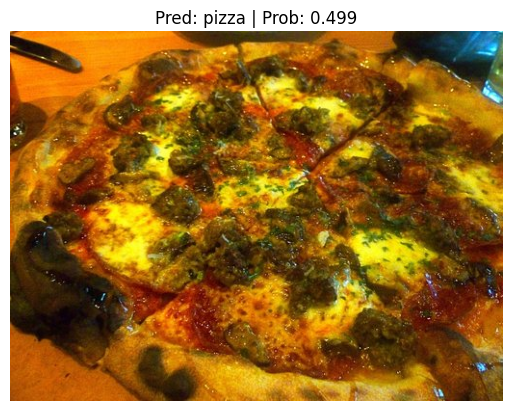

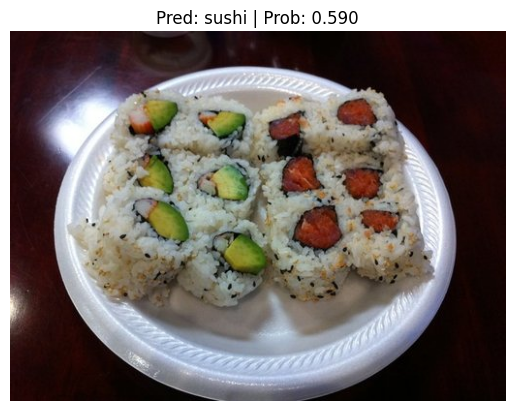

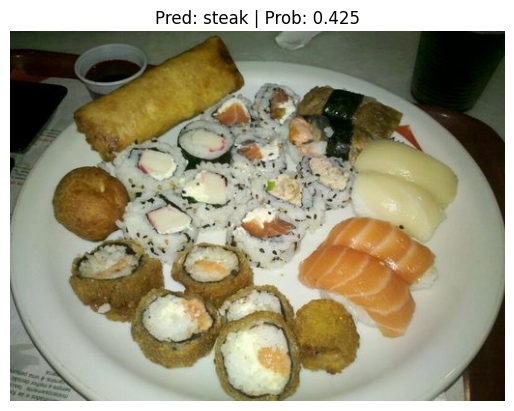

In [69]:
# Import function to make prediction on images and plot them
from going_modular.going_modular.predictions import pred_and_plot_image

# Get a random list of 3 image path names from the test dataset
import random
num_images_to_plot = 3
test_image_path_list = list(Path(data_20_percent_path / 'test').glob('*/*.jpg'))
test_image_path_sample = random.sample(test_image_path_list,
                                       k = num_images_to_plot)

for image_path in test_image_path_sample:
  pred_and_plot_image(model = best_model,
                      image_path = image_path,
                      class_names = class_names,
                      image_size = (224,224))

### 9.1 Predict on a custom image with the best model

In [ ]:
# Download custom image
import requests

# Setup custom image path
custom_image_path = Path("data/04-pizza-dad.jpeg")

# Download the image if it doesn't already exist
if not custom_image_path.is_file():
    with open(custom_image_path, "wb") as f:
        # When downloading from GitHub, need to use the "raw" file link
        request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
        print(f"Downloading {custom_image_path}...")
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")



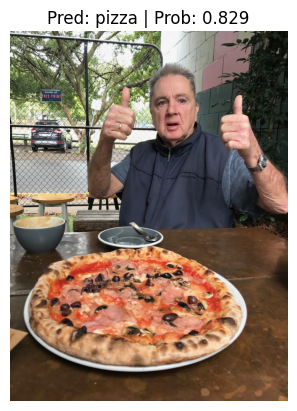

In [72]:
# Predict on custom image
pred_and_plot_image(model = model,
                    image_path = custom_image_path,
                    class_names = class_names)